# IMPORTING LIBRARIES

In [1]:
import os
import cv2
import face_recognition as fg
import plotly.express as plt

# LISTING ALL THE FILES IN THE DIRECTORY

In [2]:
known_images = os.listdir("known")
unknown_images = os.listdir("unknown")
    
known = ["./known/" + filename for filename in known_images]
names = [name[:-4].title() for name in known_images]
print(known, names, sep = "\n")

['./known/shahzaib.jpg', './known/farooq.jpg', './known/talha.jpg', './known/raheel.jpg']
['Shahzaib', 'Farooq', 'Talha', 'Raheel']


In [3]:
unknown_images

['group.JPG',
 'group_3.JPG',
 'unknown.JPG',
 'group_2.JPG',
 'group_6.JPG',
 'group_5.JPG',
 'unknown_2.jpg',
 'unknown_3.jpg',
 'group_4.JPG']

# GETTING KNOWN FACE LOCATIONS

In [4]:
for face in known:
    img = cv2.imread(face, 1)
    face_locations = fg.face_locations(img)[0]
    print(face_locations)

(116, 442, 270, 287)
(171, 646, 439, 379)
(66, 444, 156, 354)
(376, 1103, 761, 718)


# GETTING KNOWN FACE ENCODINGS

In [5]:
known_face_encodings = []

for face in known:
    img = cv2.imread(face, 1)
    face_encodings = fg.face_encodings(img)[0]
    known_face_encodings.append(face_encodings)
    
known_face_encodings

[array([-1.39480501e-01,  1.27936989e-01,  2.33381819e-02, -7.39326626e-02,
        -1.02229998e-01, -1.69161484e-02, -3.59070674e-02, -5.49770370e-02,
         2.30327487e-01, -6.77812994e-02,  2.30129272e-01,  7.64509663e-02,
        -1.23909272e-01, -7.09787160e-02,  9.61113721e-03,  9.09242481e-02,
        -1.53891936e-01, -1.98399767e-01, -5.70304096e-02, -8.26027393e-02,
        -2.08778810e-02,  3.09315734e-02, -6.35640025e-02,  4.62758839e-02,
        -1.63972035e-01, -3.04575264e-01, -4.49372977e-02, -7.50688538e-02,
         9.70161259e-02, -4.37425524e-02, -1.82509087e-02,  6.15958236e-02,
        -2.15809762e-01, -6.97659329e-02,  4.68793660e-02,  1.57175735e-01,
        -9.30764526e-03,  2.42450088e-03,  1.75219715e-01,  3.04673743e-02,
        -1.53825045e-01,  3.63036990e-03,  9.59527194e-02,  2.72738338e-01,
         1.85245693e-01,  3.13409343e-02,  8.48844275e-02, -2.79667675e-02,
         8.15051198e-02, -2.44953737e-01,  1.27897233e-01,  1.39006302e-01,
         1.3

In [6]:
names

['Shahzaib', 'Farooq', 'Talha', 'Raheel']

# GETTING ALL THE FACE LOCATIONS IN UNKNOWN IMAGE

In [7]:
img = cv2.imread("./unknown/group.jpg")
locations = fg.face_locations(img)
locations

[(99, 1061, 420, 740), (222, 634, 407, 448), (160, 345, 345, 159)]

# GETTING ALL THE FACE ENCODINGS IN UNKNOWN IMAGE

In [10]:
unknow_face_encoding = fg.face_encodings(img, locations)
unknow_face_encoding

[array([-0.13144915,  0.11367366,  0.02773044, -0.04570613, -0.04315849,
        -0.0427791 , -0.07242874, -0.0531    ,  0.07677737, -0.10023656,
         0.12350562, -0.04427439, -0.18002839,  0.00695011,  0.02183596,
         0.11725987, -0.12551363, -0.06555142, -0.12655489, -0.08667257,
         0.00684217,  0.03220717,  0.00261451,  0.10426027, -0.12281571,
        -0.39010364, -0.10388747, -0.08625201, -0.02799176, -0.04846729,
        -0.04278341,  0.06042057, -0.15650764, -0.04566214, -0.00144627,
         0.11053986, -0.07224371, -0.09467928,  0.15745816,  0.02050246,
        -0.07325178, -0.00853145,  0.04310488,  0.30116996,  0.16064548,
         0.03372733,  0.03585437, -0.04133046,  0.1235824 , -0.20791528,
         0.09432072,  0.14516643,  0.00171256,  0.16017851,  0.07809979,
        -0.06892155,  0.11679512,  0.07761686, -0.19914068,  0.04347185,
         0.03390422, -0.06376139, -0.0326978 , -0.07073504,  0.23881257,
         0.14899032, -0.1048734 , -0.09670668,  0.0

# DRAWING RECTANGLES AROUND FIRST FACE

In [13]:
top, right, bottom, left = locations[0]

img = cv2.rectangle(img, (left, top),
                    (right, bottom),
                    (255,255,255), 2)

img = cv2.rectangle(img, (right + 1, bottom),
                    (left - 1, bottom + 20),
                    (255,255,255), -1)


# SHOWING IMAGE WITH RECTANGLE DRAWN AROUND FIRST FACE


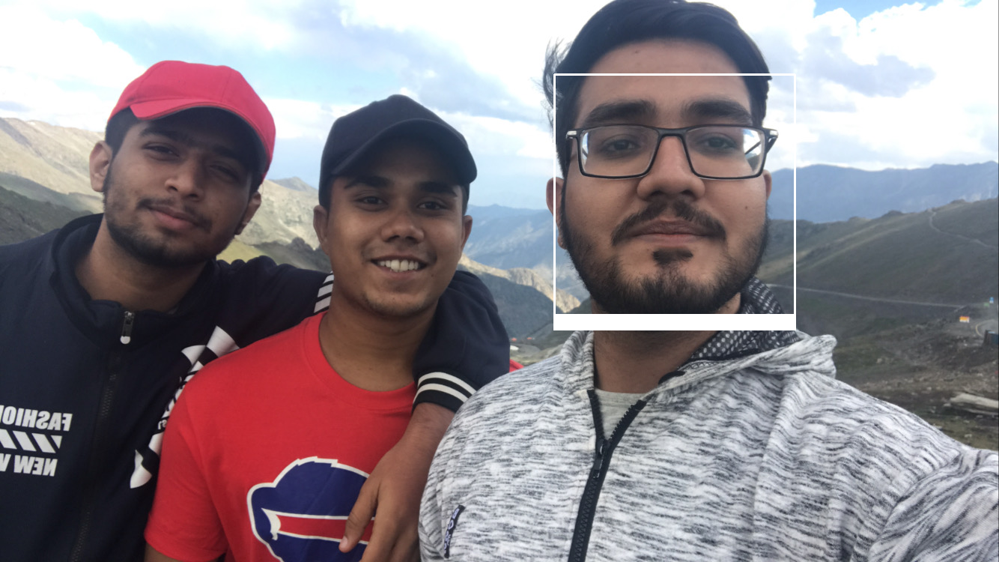

In [14]:
plt.imshow(img[:, :, ::-1])

# COMPARING FIRST FACE WITH KNOWN FACES

In [15]:
result = fg.compare_faces(known_face_encodings, unknow_face_encoding[0], tolerance = 0.53)
result

[False, True, False, False]

# GETTING THE NAME OF THE MATCH

In [16]:
person_name = "Unknown"
if True in result:
    person_name = names[result.index(True)]
person_name

'Farooq'

# PUTTING TEXT BELOW THE MATCHED FACE

In [17]:
img = cv2.putText(img, person_name, (left + 5, bottom + 15),
                  cv2.FONT_HERSHEY_SIMPLEX,  0.5, (0,0,0), 1, cv2.LINE_AA)

# SHOWING IMAGE WITH MATCHED FACE AND PERSON NAME


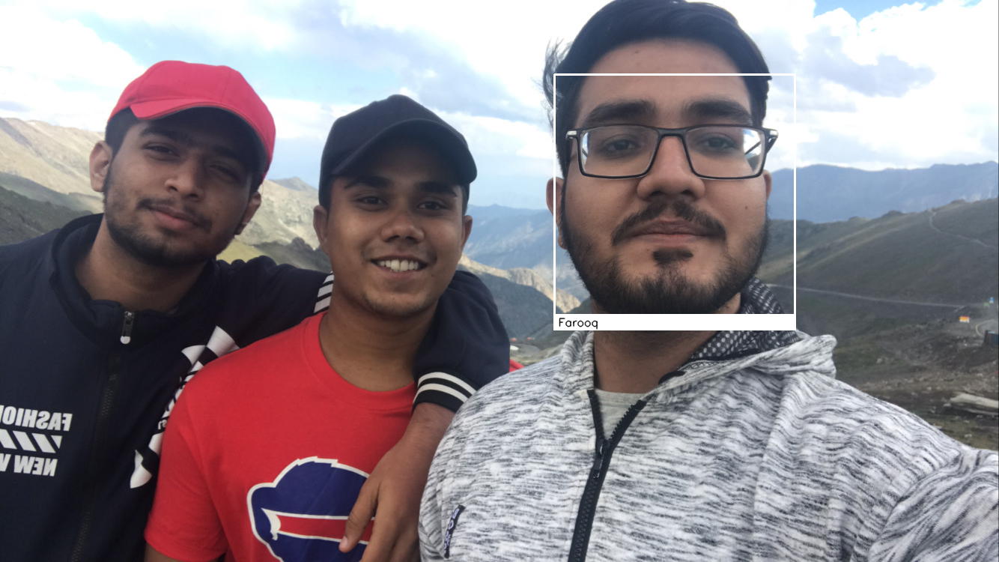

In [18]:
plt.imshow(img[:, :, ::-1])

# DRAWING RECTANGLE AROUND SECOND FACE

In [19]:
top, right, bottom, left = locations[1]

img = cv2.rectangle(img, (left, top),
                    (right, bottom),
                    (255,255,255), 2)

img = cv2.rectangle(img, (right + 1, bottom),
                    (left - 1, bottom + 20),
                    (255,255,255), -1)

# SHOWING IMAGE WITH RECTANGLE DRAWN AROUND SECOND FACE


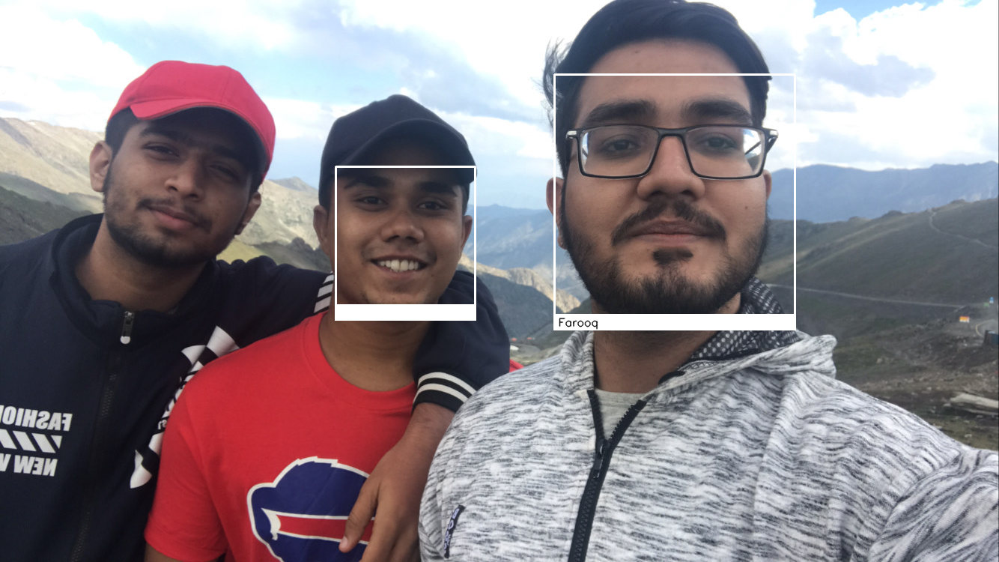

In [20]:
plt.imshow(img[:, :, ::-1])

# COMPARING SECOND FACE WITH KNOWN FACES

In [21]:
result = fg.compare_faces(known_face_encodings, unknow_face_encoding[1], tolerance = 0.53)
result

[False, False, False, True]

# GETTING THE NAME OF THE SECOND MATCH

In [22]:
person_name = "Unknown"
if True in result:
    person_name = names[result.index(True)]
person_name

'Raheel'

# PUTTING TEXT BELOW SECOND MATCHED FACE

In [23]:
img = cv2.putText(img, person_name, (left + 5, bottom + 15),
                  cv2.FONT_HERSHEY_SIMPLEX,  0.5, (0,0,0), 1, cv2.LINE_AA)

# SHOWING IMAGE WITH SECOND MATCHED FACE AND PERSON NAME


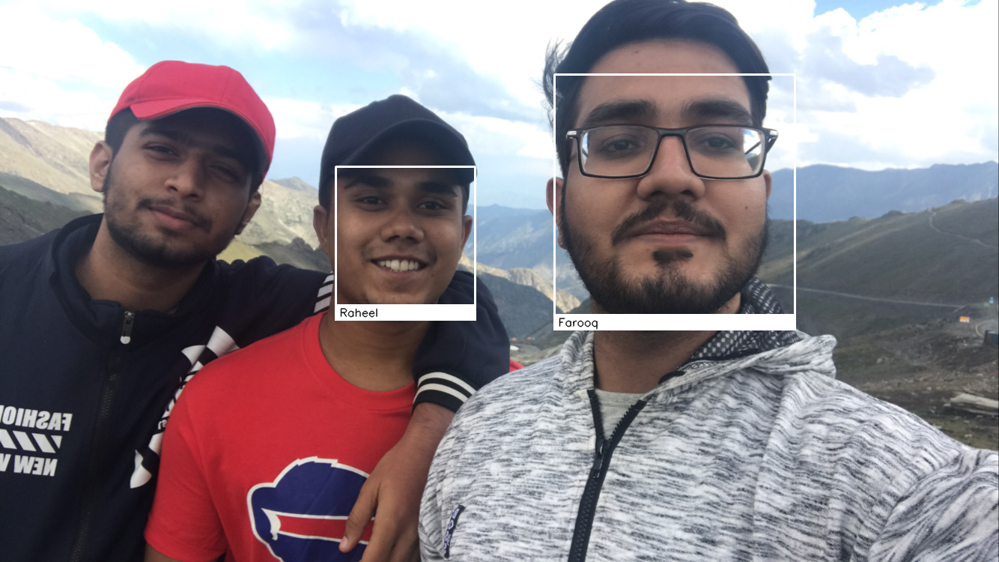

In [24]:
plt.imshow(img[:, :, ::-1])

# DRAWING RECTANGLE AROUND THIRD FACE

In [25]:
top, right, bottom, left = locations[2]

img = cv2.rectangle(img, (left, top),
                    (right, bottom),
                    (255,255,255), 2)

img = cv2.rectangle(img, (right + 1, bottom),
                    (left - 1, bottom + 20),
                    (255,255,255), -1)

# SHOWING IMAGE WITH RECTANGLE DRAWN AROUND THIRD FACE


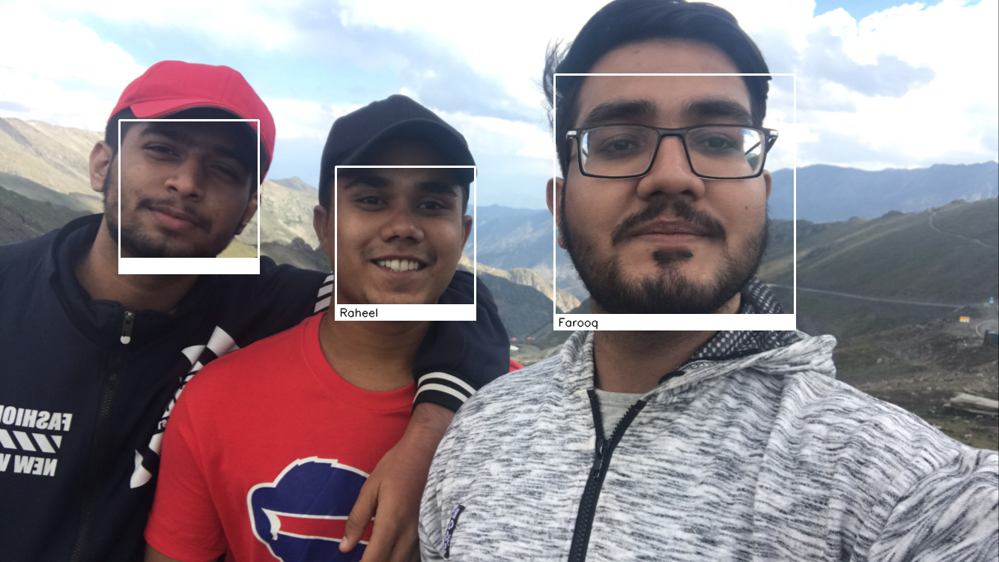

In [26]:
plt.imshow(img[:, :, ::-1])

# COMPARING THIRD FACE WITH KNOWN FACES

In [27]:
result = fg.compare_faces(known_face_encodings, unknow_face_encoding[2], tolerance = 0.53)
result

[False, False, True, False]

# GETTING THE NAME OF THE THIRD MATCH

In [28]:
person_name = "Unknown"
if True in result:
    person_name = names[result.index(True)]
person_name

'Talha'

# PUTTING TEXT BELOW THIRD MATCHED FACE

In [29]:
img = cv2.putText(img, person_name, (left + 5, bottom + 15),
                  cv2.FONT_HERSHEY_SIMPLEX,  0.5, (0,0,0), 1, cv2.LINE_AA)

# SHOWING IMAGE WITH THIRD MATCHED FACE AND PERSON NAME


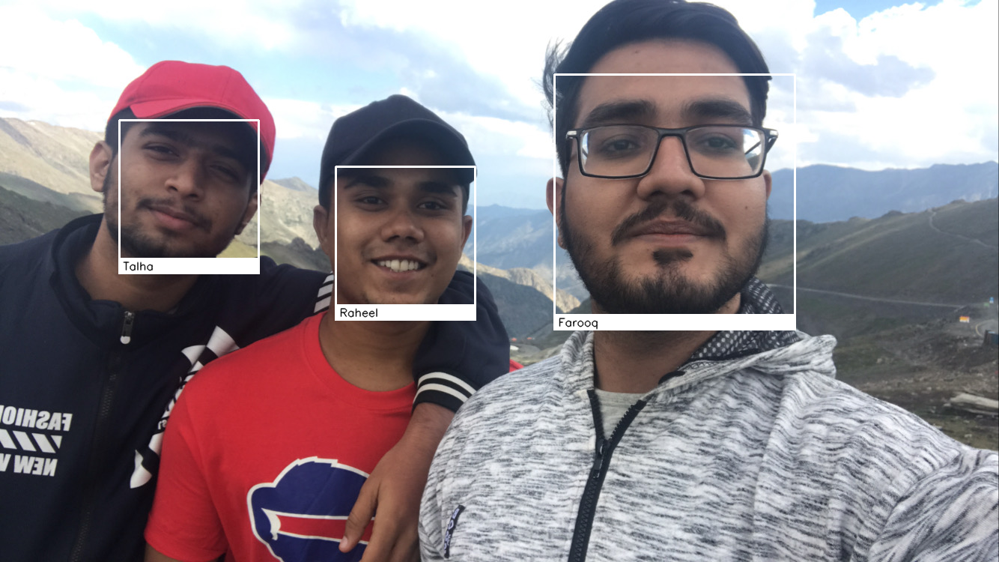

In [30]:
plt.imshow(img[:, :, ::-1])